In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import pprint
import json

In [3]:
with open('sample_airbnb.json', 'r') as airbnb_file:
    airbnb_json = json.load(airbnb_file)
    #pprint.pprint(airbnb_json)
# Normalize nested JSON
#df = pd.json_normalize(data)

In [4]:
airbnb_data = [
    [
        i.get("_id"),
        i.get("listing_url"),
        i.get("name"),
        i.get("description"),
        i.get("house_rules"),
        i.get("property_type"),
        i.get("room_type"),
        i.get("bed_type"),
        i.get("minimum_nights"),
        i.get("maximum_nights"),
        i.get("cancellation_policy"),
        i.get("accommodates"),
        i.get("bedrooms"),
        i.get("beds"),
        i.get("bathrooms"),
        i.get("availability",{}).get("availability_365"),
        i.get("price"),
        i.get("security_deposit"),
        i.get("cleaning_fee"),
        i.get("extra_people"),
        i.get("guests_included"),
        i.get("number_of_reviews"),
        i.get("review_scores", {}).get("review_scores_rating"),
        ", ".join(i["amenities"]),  
        i.get("host", {}).get("host_id"),
        i.get("host", {}).get("host_name"),
        i.get("address", {}).get("street"),
        i.get("address", {}).get("country"),
        i.get("address", {}).get("country_code"),      
        i.get("address", {}).get("location", {}).get("type"),
        i.get("address", {}).get("location", {}).get("coordinates")[0],
        i.get("address", {}).get("location", {}).get("coordinates")[1],
        i.get("address", {}).get("location", {}).get("is_location_exact") 
        ] 
    for i in airbnb_json
]

In [5]:
pprint.pprint(airbnb_data)

[['1003530',
  'https://www.airbnb.com/rooms/1003530',
  'New York City - Upper West Side Apt',
  'Murphy bed, optional second bedroom available. Wifi available, Hulu, '
  'Netflix, TV Eat-in kitchen. Bathroom with great shower/bath.  Washer/dryer '
  'in basement. New York City! Great neighborhood - many terrific restaurants, '
  'bakeries, bagelries. Within easy walking distance are restaurants with the '
  'cuisines from India, Thailand, Japan, China, Mexico, South America and '
  'Europe.  As well as the many small independent stores that line Broadway, '
  'there chain stores such as Urban Outfitters (clothing), Whole Foods '
  "(groceries), Sephora (cosmetics), Michaels (crafts), and Modell's (sporting "
  'goods). Equidistant to Central Park and Riverside Park which have '
  'walking/running/biking trails as well as tennis and racquet ball courts. '
  '10-15 blocks from Columbia University between Broadway and Amsterdam. The '
  'International Hostel across the street is an airp

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



'30129761',
  'https://www.airbnb.com/rooms/30129761',
  'Quarto na Tijuca próximo ao metro',
  'Local: - próximo ao Metro da Estação Uruguai; - transporte para o Centro e '
  'Niterói na esquina e demais localidades; - amplo comércio (farmácias, '
  'bancos, mercados, shoppings, bares, restaurantes...); - rua em frente ao '
  'Hortifruti da Rua Uruguai. Os hospedes terão acesso ao terraço da casa.',
  '',
  'Villa',
  'Private room',
  'Real Bed',
  '1',
  '7',
  'flexible',
  1,
  1,
  1,
  2.0,
  363,
  41.0,
  None,
  None,
  0.0,
  1.0,
  0,
  None,
  'Wifi, Kitchen, Smoking allowed, Pets allowed, Washer, Essentials, Lock on '
  'bedroom door, Hangers, Iron, Laptop friendly workspace, Private living '
  'room, Hot water',
  '226397735',
  'Matheus',
  'Tijuca, Rio de Janeiro, Brazil',
  'Brazil',
  'BR',
  'Point',
  -43.24694348253448,
  -22.928687490237493,
  True],
 ['3014692',
  'https://www.airbnb.com/rooms/3014692',
  'Smart Luxury KissMe 2BR balcony',
  'When you walk into 

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [6]:
#creating dataframe

airbnb_df_columns = [
    "ID", "url", "Name", "Description", "House_Rules", "Property_Type", "Room_Type", "Bed_Type",
    "Minimum_Nights", "Maximum_Nights", "Cancelation_Policy", "Accomodates", "Bedrooms",
    "Beds", "Bathrooms", "Availability_365", "Price", "Security_Deposit", "Cleaning_Fee", "Extra_People",
    "Guests_Included", "No_Of_Reviews", "Review_Scores", "Amenities", "Host_ID", "Host_Name",
    "Street", "Country", "Country_Code", "Location_Type", "Latitude", "Longitude", "Exact_Location"
]

airbnb_df = pd.DataFrame(airbnb_data, columns=airbnb_df_columns)

print(airbnb_df)

            ID                                    url  \
0      1003530   https://www.airbnb.com/rooms/1003530   
1     10133554  https://www.airbnb.com/rooms/10133554   
2     10059872  https://www.airbnb.com/rooms/10059872   
3     10084023  https://www.airbnb.com/rooms/10084023   
4     10091713  https://www.airbnb.com/rooms/10091713   
...        ...                                    ...   
5550   9985696   https://www.airbnb.com/rooms/9985696   
5551   9993190   https://www.airbnb.com/rooms/9993190   
5552   9887054   https://www.airbnb.com/rooms/9887054   
5553   9907907   https://www.airbnb.com/rooms/9907907   
5554   9936016   https://www.airbnb.com/rooms/9936016   

                                                   Name  \
0                   New York City - Upper West Side Apt   
1                   Double and triple rooms Blue mosque   
2                    Soho Cozy, Spacious and Convenient   
3                     City center private room with bed   
4      Surry Hills S

In [7]:
airbnb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5555 entries, 0 to 5554
Data columns (total 33 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5555 non-null   object 
 1   url                 5555 non-null   object 
 2   Name                5555 non-null   object 
 3   Description         5555 non-null   object 
 4   House_Rules         5555 non-null   object 
 5   Property_Type       5555 non-null   object 
 6   Room_Type           5555 non-null   object 
 7   Bed_Type            5555 non-null   object 
 8   Minimum_Nights      5555 non-null   object 
 9   Maximum_Nights      5555 non-null   object 
 10  Cancelation_Policy  5555 non-null   object 
 11  Accomodates         5555 non-null   int64  
 12  Bedrooms            5550 non-null   float64
 13  Beds                5542 non-null   float64
 14  Bathrooms           5545 non-null   float64
 15  Availability_365    5555 non-null   int64  
 16  Price 

In [8]:
airbnb_df.isnull().sum()

ID                       0
url                      0
Name                     0
Description              0
House_Rules              0
Property_Type            0
Room_Type                0
Bed_Type                 0
Minimum_Nights           0
Maximum_Nights           0
Cancelation_Policy       0
Accomodates              0
Bedrooms                 5
Beds                    13
Bathrooms               10
Availability_365         0
Price                    0
Security_Deposit      2084
Cleaning_Fee          1531
Extra_People             0
Guests_Included          0
No_Of_Reviews            0
Review_Scores         1474
Amenities                0
Host_ID                  0
Host_Name                0
Street                   0
Country                  0
Country_Code             0
Location_Type            0
Latitude                 0
Longitude                0
Exact_Location           0
dtype: int64

In [9]:
#Filling unknown values

airbnb_df.Bedrooms.fillna(airbnb_df.Bedrooms.median(),inplace=True)
airbnb_df.Beds.fillna(airbnb_df.Beds.median(),inplace= True)
airbnb_df.Bathrooms.fillna(airbnb_df.Bathrooms.mode()[0],inplace= True)
airbnb_df.Review_Scores.fillna(airbnb_df.Review_Scores.median(),inplace=True)
airbnb_df.Security_Deposit.fillna(airbnb_df.Security_Deposit.median(),inplace=True)
airbnb_df.Cleaning_Fee.fillna(airbnb_df.Cleaning_Fee.median(), inplace=True)
airbnb_df.Description.replace(to_replace="",value="No Description Provided",inplace=True)
airbnb_df.House_Rules.replace(to_replace="",value="No House rules Provided",inplace=True)
airbnb_df.Amenities.replace(to_replace="",value="Not Available",inplace=True)



C:\Users\Bhargavi Ingale\AppData\Local\Temp\ipykernel_13120\2278318094.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  airbnb_df.Bedrooms.fillna(airbnb_df.Bedrooms.median(),inplace=True)
C:\Users\Bhargavi Ingale\AppData\Local\Temp\ipykernel_13120\2278318094.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting va

In [10]:
airbnb_df.isnull().sum()

ID                    0
url                   0
Name                  0
Description           0
House_Rules           0
Property_Type         0
Room_Type             0
Bed_Type              0
Minimum_Nights        0
Maximum_Nights        0
Cancelation_Policy    0
Accomodates           0
Bedrooms              0
Beds                  0
Bathrooms             0
Availability_365      0
Price                 0
Security_Deposit      0
Cleaning_Fee          0
Extra_People          0
Guests_Included       0
No_Of_Reviews         0
Review_Scores         0
Amenities             0
Host_ID               0
Host_Name             0
Street                0
Country               0
Country_Code          0
Location_Type         0
Latitude              0
Longitude             0
Exact_Location        0
dtype: int64

In [11]:
#Changing required data types

airbnb_df["Minimum_Nights"] = airbnb_df["Minimum_Nights"].astype(int)
airbnb_df["Maximum_Nights"] = airbnb_df["Maximum_Nights"].astype(int)
airbnb_df["Bedrooms"] = airbnb_df["Bedrooms"].astype(int)
airbnb_df["Beds"] = airbnb_df["Beds"].astype(int)
airbnb_df["Bathrooms"] = airbnb_df["Bathrooms"].astype(int)
airbnb_df["Extra_People"] = airbnb_df["Extra_People"].astype(int)
airbnb_df["Guests_Included"] = airbnb_df["Guests_Included"].astype(int)

In [12]:
#removing redundant unwanted data

count_empty_string = airbnb_df["Name"].eq("").any()


In [13]:
print("empty string", count_empty_string)

empty string True


In [14]:
airbnb_df.drop(airbnb_df.index[airbnb_df['Name'] == ''], inplace=True)
airbnb_df.drop_duplicates(inplace=True)
airbnb_df.reset_index(drop=True,inplace=True)
print(airbnb_df.isnull().sum())
airbnb_df.info()

ID                    0
url                   0
Name                  0
Description           0
House_Rules           0
Property_Type         0
Room_Type             0
Bed_Type              0
Minimum_Nights        0
Maximum_Nights        0
Cancelation_Policy    0
Accomodates           0
Bedrooms              0
Beds                  0
Bathrooms             0
Availability_365      0
Price                 0
Security_Deposit      0
Cleaning_Fee          0
Extra_People          0
Guests_Included       0
No_Of_Reviews         0
Review_Scores         0
Amenities             0
Host_ID               0
Host_Name             0
Street                0
Country               0
Country_Code          0
Location_Type         0
Latitude              0
Longitude             0
Exact_Location        0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5547 entries, 0 to 5546
Data columns (total 33 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------

In [15]:
#Formatting new line values in Data Frame
for i in range(airbnb_df.shape[0]):
    txt = airbnb_df.iloc[i]["Street"]
    fmt_txt = txt.replace("\n", "")
    airbnb_df.at[i, "Street"] = fmt_txt

In [16]:
#Converting processed data as csv file

airbnb_df.to_csv(r"C:\Users\Bhargavi Ingale\OneDrive\Desktop\Guvi\sample_airbnb.csv",index=False)


In [17]:
df = pd.read_csv('sample_airbnb.csv')
df.head()

,ID,url,Name,Description,House_Rules,Property_Type,Room_Type,Bed_Type,Minimum_Nights,Maximum_Nights,...,Amenities,Host_ID,Host_Name,Street,Country,Country_Code,Location_Type,Latitude,Longitude,Exact_Location
0,1003530,https://www.airbnb.com/rooms/1003530,New York City - Upper West Side Apt,"Murphy bed, optional second bedroom available....",No smoking is permitted in the apartment. All ...,Apartment,Private room,Real Bed,12,360,...,"Internet, Wifi, Air conditioning, Kitchen, Ele...",454250,Greta,"New York, NY, United States",United States,US,Point,-73.96523,40.79962,False
1,10133554,https://www.airbnb.com/rooms/10133554,Double and triple rooms Blue mosque,We are on the central city Blue mosque 5 minu...,No House rules Provided,Bed and breakfast,Private room,Real Bed,1,1125,...,"Internet, Wifi, Air conditioning, Free parking...",52004703,Mehmet Emin,"Fatih , İstanbul, Turkey",Turkey,TR,Point,28.98009,41.00620,False
2,10059872,https://www.airbnb.com/rooms/10059872,"Soho Cozy, Spacious and Convenient","Clean, fully furnish, Spacious 1 bedroom flat ...",No House rules Provided,Apartment,Entire home/apt,Real Bed,4,20,...,"Air conditioning, Kitchen, Smoking allowed, Do...",51624384,Giovanni,"Hong Kong, Hong Kong Island, Hong Kong",Hong Kong,HK,Point,114.15027,22.28158,True
3,10084023,https://www.airbnb.com/rooms/10084023,City center private room with bed,House is located 5mins walk from Sham Shui Po ...,"1. 禁止吸煙, 只限女生入住 (除得到批准) No smoking and only fe...",Guesthouse,Private room,Futon,1,500,...,"TV, Wifi, Air conditioning, Kitchen, Elevator,...",51744313,Yi,"Hong Kong , 九龍, Hong Kong",Hong Kong,HK,Point,114.16690,22.33140,True
4,10091713,https://www.airbnb.com/rooms/10091713,Surry Hills Studio - Your Perfect Base in Sydney,"This spacious, light filled studio has everyth...","No smoking: No smoking any substance, includi...",Apartment,Entire home/apt,Real Bed,10,21,...,"TV, Wifi, Kitchen, Elevator, Heating, Washer, ...",13764143,Ben,"Surry Hills, NSW, Australia",Australia,AU,Point,151.21554,-33.88029,True


Text(0.5, 1.0, 'Top 10 Property Types available')

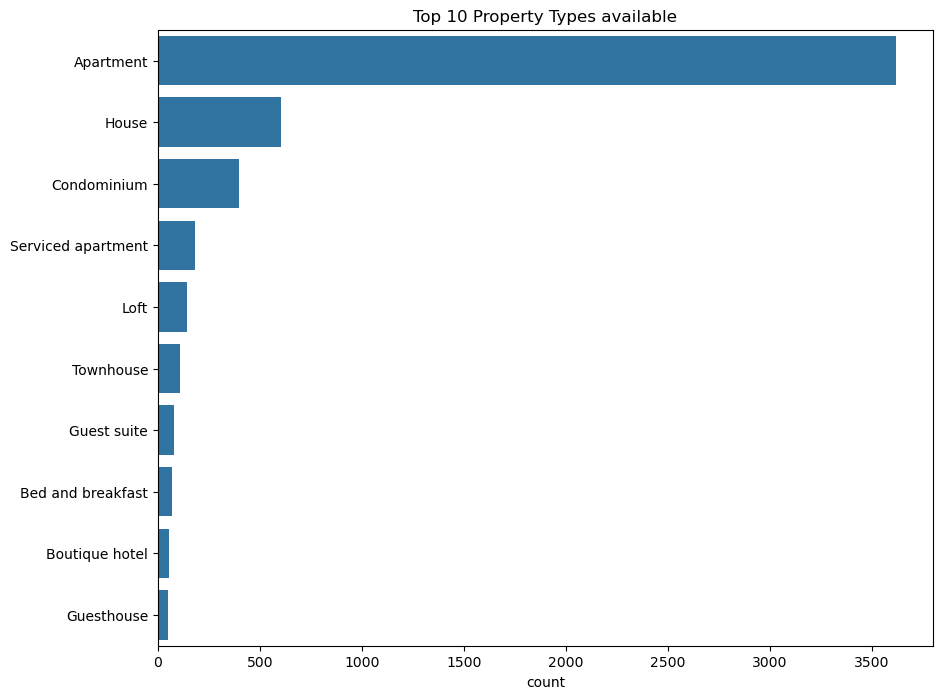

In [18]:
plt.figure(figsize=(10,8))
ax = sns.countplot(data=df,y=df.Property_Type.values,order=df.Property_Type.value_counts().index[:10])
ax.set_title("Top 10 Property Types available")

Text(0.5, 1.0, 'Total Listings in each Room Type')

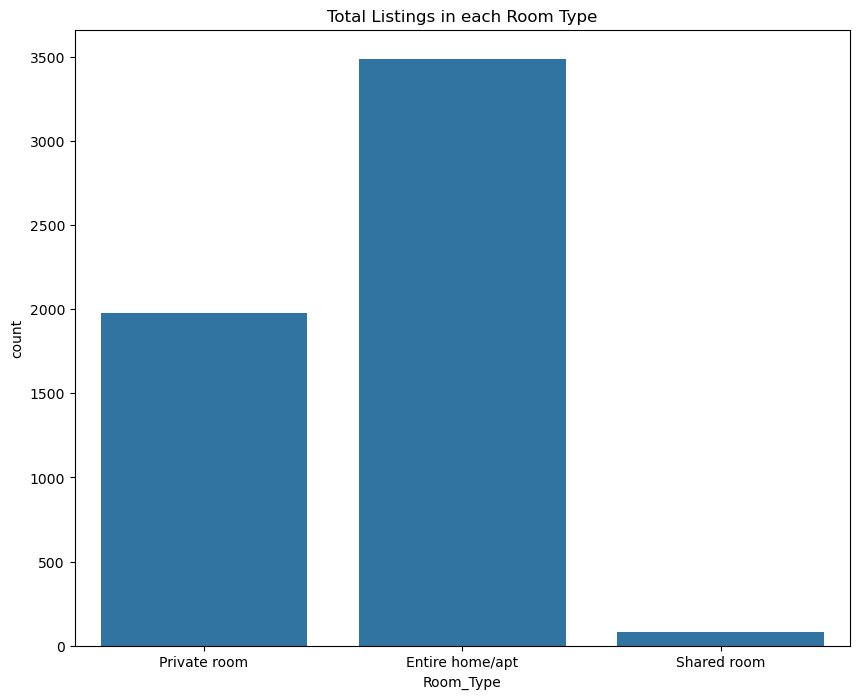

In [19]:
plt.figure(figsize=(10,8))
ax = sns.countplot(data=df,x=df.Room_Type)
ax.set_title("Total Listings in each Room Type")

ValueError: 
    Invalid value of type 'builtins.str' received for the 'locationmode' property of choropleth
        Received value: 'Country Names'

    The 'locationmode' property is an enumeration that may be specified as:
      - One of the following enumeration values:
            ['ISO-3', 'USA-states', 'country names', 'geojson-id']

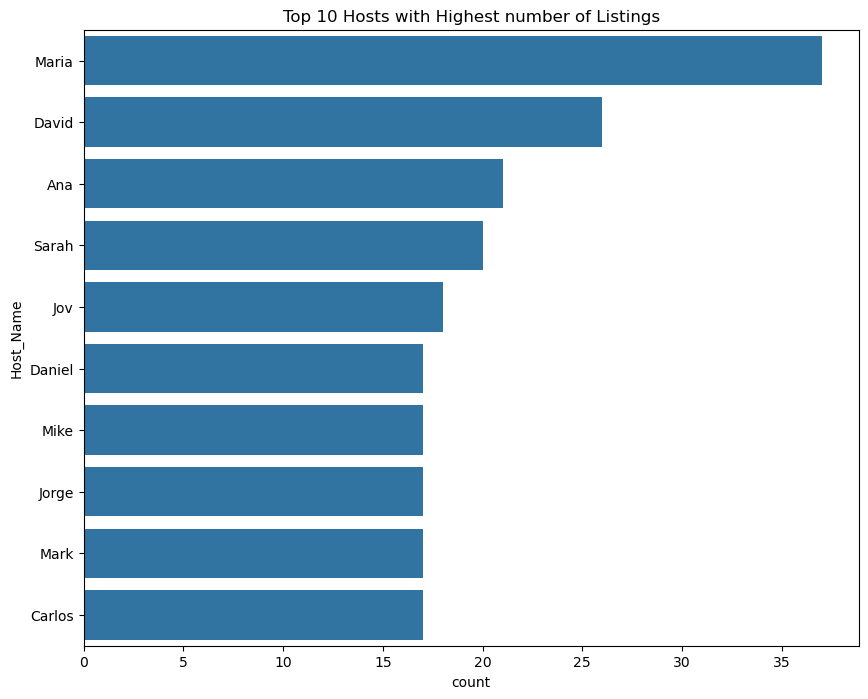

In [20]:
plt.figure(figsize=(10,8))
ax = sns.countplot(data=df,y=df['Host_Name'],order=df['Host_Name'].value_counts().index[:10])
ax.set_title("Top 10 Hosts with Highest number of Listings")

fig = px.choropleth(data_frame=df,
                    locations='Country_Code',
                    color='Country',
                    locationmode='Country Names')
fig.show()

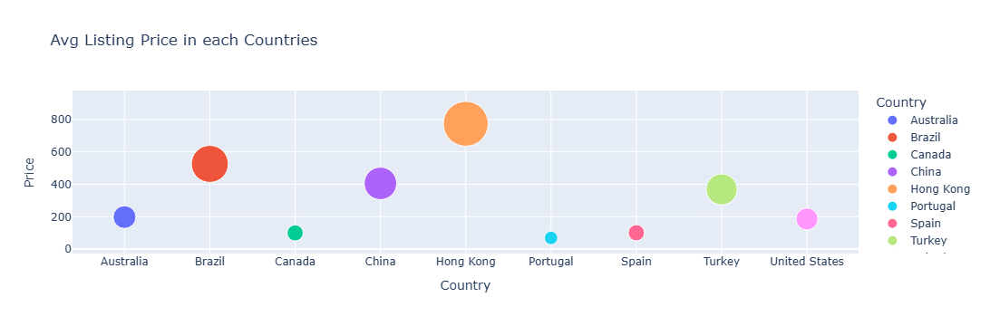

In [21]:
country_df = df.groupby('Country',as_index=False)['Price'].mean()

fig = px.scatter(data_frame=country_df,
           x='Country',y='Price',
           color='Country',
           size='Price',
           opacity=1,
           size_max=35,
           title='Avg Listing Price in each Countries')
fig.show()

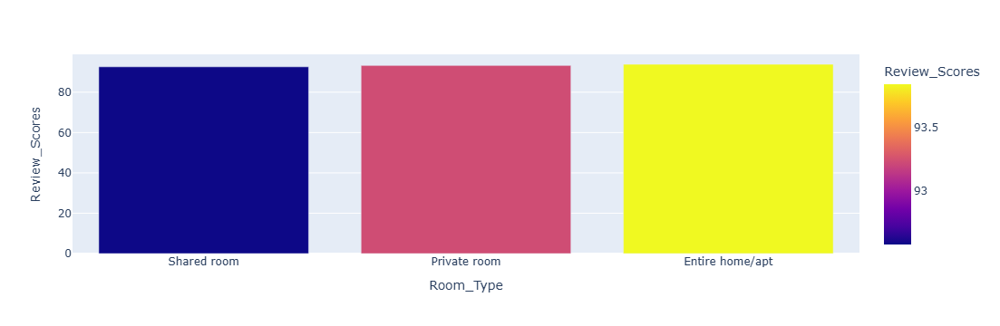

In [22]:
rev_df = df.groupby('Room_Type',as_index=False)['Review_Scores'].mean().sort_values(by='Review_Scores')
fig = px.bar(data_frame=rev_df,x='Room_Type',y='Review_Scores',color='Review_Scores')
fig.show()

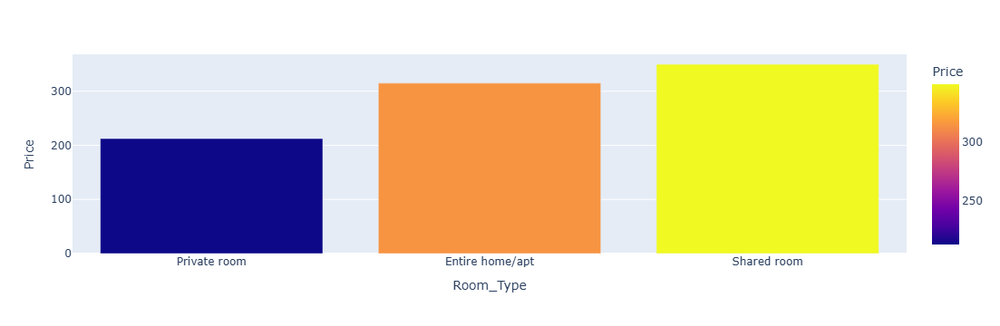

In [23]:
pr_df = df.groupby('Room_Type',as_index=False)['Price'].mean().sort_values(by='Price')
fig = px.bar(data_frame=pr_df,x='Room_Type',y='Price',color='Price')
fig.show()